## Домашнее задание 3 (10 баллов)

## НИУ ВШЭ, 2024-25 учебный год

## Формат сдачи

Сам ноутбук называйте в формате hw-03-USERNAME.ipynb, где USERNAME — ваши фамилия и имя. Файл надо будет сдать в anytask.

## О задании

В этом домашнем задании вы получите опыт подготовки данных и EDA (Exploratory Data Analysis), приблизившись к реальной работе с данными с помощью уже знакомых вам инструментов: numpy, pandas, matplotlib и seaborn, а также познакомитесь с plotly.

EDA - важный этап работы с данными. Именно в процессе EDA вы можете выяснить особенности датасета, найти зависимости в данных, протестировать гипотезы о взаимосвязях признаков и целевой переменной. В реальности вы сами будете определять, что и как проверять в рамках EDA, однако в данной работе гипотезы будут выдвинуты за вас автором задания. Также и типы графиков, которые вы будете использовать уже предопределены за вас. Выполняя задания по визуализациям, обращайте внимание на референсные картинки, которые были оставлены авторами. Они показывают, какой примерно результат от вас ожидается.

Это задание будет включать в себя построение некоторого количества графиков, потому вот основные правила, в соответствии с которыми графики должны быть оформлены:
1. Любой график всегда имеет название.
2. Оси у графика подписаны (исключение - график делит название оси с соседним).
3. Подписи делаются на одном языке (либо английский, либо русский), но не на их смеси.
4. Если вы выводите несколько графиков, то они размещаются в рамках одного объекта matplotlib.pyplot.figure. Вы не выводите графики последовательно, а смотрите, как их разместить сразу все за раз.
5. Отдельные графики (если графиков на картинке больше 1) также имеют свои названия.
6. Если на графике есть несколько различных объектов, то для их различения используется легенда. Помещайте легенду в место, где она в наименьшей мере мешает восприятию самого графика.
7. Если есть легенда, то она должна иметь навание, а также ее содержание должно быть адекватными (пожалейте проверяющих, они не хотят разбирать, а к чему относится зеленая линия, которая на легенде помечена меткой "0").
8. Используйте цветовые гаммы, чтобы объекты на графиках отличались цветом.
9. Текст на визуализации должен быть читаем. Если вы вывели названия категорий в качестве подписей на оси Х, а эти названия наезжают друг на друга, то вам нужно что-то с этим сделать. Нечитаемый или плохо читаемый (очень маленький, невероятно огромный) текст ведет к снижению баллов.

При работе с табличными данными используйте функционал [style](https://pandas.pydata.org/docs/user_guide/style.html#Builtin-Styles), чтобы визуально выделять необходимые элементы.

В этом задании будут оцениваться ваши развернутые комментарии, размышления и выводы (по построенным графикам): не скупитесь на них, но следите, чтобы выводы не были поверхностными и очевидными.

*Тут правило про плагиат, которое вам итак известно - обнуляются все работы, которые подозреваются в некорректных заимствованиях!* Помните, что просто скопировать код из интернета и указать источник - это не ваша самостоятельная работа, а автора кода. Измените хоть что-нибудь в коде.

## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones).

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее). То есть каждое окно покрывает 2.56 секунды данных (два шага человека при ходьбе, учитывая медленную походку пожилых людей).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано в [самой статье](https://www.esann.org/sites/default/files/proceedings/legacy/es2013-84.pdf))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извлечены те же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

Вероятно, сначала покажется сложным, но мы разберемся с некоторыми признаками в отдельности и вы сможете понять их смысл, уже исходя из фактических соотношений.

## Предобработка данных

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings

warnings.filterwarnings("ignore")
# pd.set_option('display.max_columns', 7)
pd.set_option('display.width', 150)
sns.set_style("whitegrid")

In [12]:
train = pd.read_csv('train.csv')
test = pd.read_csv("test.csv")

In [13]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Мы за вас сделали подвыборку признаков для удобства работы с ними.

In [14]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [15]:
train = train[cols_subset]
test = test[cols_subset]

### Задание 1 (0.5 балла)

Посмотрите на пропуски и дубли в данных train и test. Есть ли они? Если есть, напишите, с чем это может быть связано? Если нет, то просто напишите, что пропусков и/или дублей нет.

In [16]:
print("-" * 15 + "TRAIN:" + "-" * 15)
print("    Missing data in columns:")
print(train[cols_subset].isna().any())
print("    Duplicated data in columns:")
print((train[cols_subset].nunique() < train.shape[0]))
print("-" * 15 + "TEST:" + "-" * 15)
print("    Missing data in columns:")
print(test[cols_subset].isna().any())
print("    Duplicated data in columns:")
print((test[cols_subset].nunique() < test.shape[0]))

---------------TRAIN:---------------
    Missing data in columns:
tBodyAccMag-mean()              False
tBodyGyroJerk-mad()-X           False
tGravityAcc-min()-X             False
tBodyAcc-max()-X                False
fBodyAcc-bandsEnergy()-1,8.2    False
angle(X,gravityMean)            False
angle(Y,gravityMean)            False
angle(Z,gravityMean)            False
fBodyAcc-skewness()-X           False
subject                         False
Activity                        False
dtype: bool
    Duplicated data in columns:
tBodyAccMag-mean()               True
tBodyGyroJerk-mad()-X            True
tGravityAcc-min()-X              True
tBodyAcc-max()-X                 True
fBodyAcc-bandsEnergy()-1,8.2     True
angle(X,gravityMean)            False
angle(Y,gravityMean)            False
angle(Z,gravityMean)            False
fBodyAcc-skewness()-X            True
subject                          True
Activity                         True
dtype: bool
---------------TEST:---------------
    Mi

Как мы видим, в обеих выборках нет пропусков (везде false)
А вот одни и те же значения по столбцам (дубликаты) есть. В обучающей выборке во всех колонках кроме углов, в тестовой - во всех колонках кроме углов, fBodyAcc-skewness()-X и tBodyAccMag-mean(). Это означает, что для разных двух окон сигналов есть одни и те свойства. Это логично, потому что сигналов было достаточно много

### Задание 2 (0.5 балла)

Выведите основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение. Посмотрите на таблицу и напишите, видите ли вы в ней что-нибудь интересное.

In [17]:
print(train[cols_subset].describe())

       tBodyAccMag-mean()  tBodyGyroJerk-mad()-X  tGravityAcc-min()-X  tBodyAcc-max()-X  fBodyAcc-bandsEnergy()-1,8.2  angle(X,gravityMean)  \
count         7352.000000            7352.000000          7352.000000       7352.000000                   7352.000000           7352.000000   
mean            -0.543884              -0.727735             0.678505         -0.468604                     -0.847963             -0.489547   
std              0.477653               0.315832             0.508656          0.544547                      0.233633              0.511807   
min             -1.000000              -0.999889            -1.000000         -1.000000                     -1.000000             -1.000000   
25%             -0.983282              -0.991595             0.804270         -0.936219                     -0.999480             -0.812065   
50%             -0.883371              -0.950268             0.926693         -0.881637                     -0.986582             -0.709417   

Заметно, что почти во всех колонках медиана (50%) расположена вдалеке от среднего значения (mean), что говорит о большом количестве выбросов, но это не относится к угловым характеристикам. Также это говорит о смещении мат. ожидания распределения вправо

### Задание 3 (0.5 балла)

Данные сбалансированы? У вас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Выведите количество наблюдений для всех категорий активности в train и test. Посчитайте разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы. Напишите, сбалансированы ли данные в train и test.

In [18]:
count_of_records_train = train.groupby("Activity").size()
print(count_of_records_train.max(), count_of_records_train.min(),
      count_of_records_train.min() / count_of_records_train.max())

count_of_records_test = test.groupby("Activity").size()
print(count_of_records_test.max(), count_of_records_test.min(),
      count_of_records_test.min() / count_of_records_test.max())

1407 986 0.7007818052594172
537 420 0.7821229050279329


Видим, что минимальное количество измерений для активности равно практически 70% от максимального количества измерений для активностей. Разница не превышает 30%, поэтому считаем данные в `train` сбалансированными
С test ситуация ещё лучше, т.к. разница составляет 22%, значит данные в `test` тоже сбалансированны

### Задание 4 (0.5 балла)

Посчитайте корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

In [19]:
train["Activity_code"], types = pd.factorize(train["Activity"])
print(types)
cols_subset.append("Activity_code")
if "Activity" in cols_subset:
    cols_subset.remove("Activity")
correlation_matrix = train[cols_subset].corr()
print(correlation_matrix)


Index(['STANDING', 'SITTING', 'LAYING', 'WALKING', 'WALKING_DOWNSTAIRS', 'WALKING_UPSTAIRS'], dtype='object')
                              tBodyAccMag-mean()  tBodyGyroJerk-mad()-X  tGravityAcc-min()-X  tBodyAcc-max()-X  fBodyAcc-bandsEnergy()-1,8.2  \
tBodyAccMag-mean()                      1.000000               0.899080             0.369962          0.959827                      0.697832   
tBodyGyroJerk-mad()-X                   0.899080               1.000000             0.380118          0.879900                      0.507939   
tGravityAcc-min()-X                     0.369962               0.380118             1.000000          0.380404                      0.239088   
tBodyAcc-max()-X                        0.959827               0.879900             0.380404          1.000000                      0.613383   
fBodyAcc-bandsEnergy()-1,8.2            0.697832               0.507939             0.239088          0.613383                      1.000000   
angle(X,gravityMean)      

Значения где-то получились сильно коррелирующими, где-то очень слабо коррелирующими. Возможно, потому что наши таргеты закодировались в таком порядке, что чем больше их индекс, тем энергозатранее и более ускоренно двигается человек в данной активности. Поэтому возрастания значений ускорения совпадают с возрастанием индекса, это в большинстве случаев даёт линейную зависимость.

Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

### Задание 5 (0.5 балла)

Вы проверили основную информацию о данных и составили свое первое впечатление о них. Теперь визуализации.

Начнем рисовать графики с небольшой разминки. Выберите две любые математические функции (отличные от линейной) и нарисуйте их на одном графике. Подпишите каждый из графиков, чтобы было понятно, какие функции вы выбрали.
__Первый график (извините, если минус глаза):__ $$\tan(x^2 + y^2) = 1 $$
__Второй график (:3):__ $$(x^2 + y^2 - 16)^3 = x^2 y^3 4$$
__Третий график (просто чтобы потом смотреть у себя, как не контур-графики рисовать):__ $$y=-||x^2-2|-3|$$

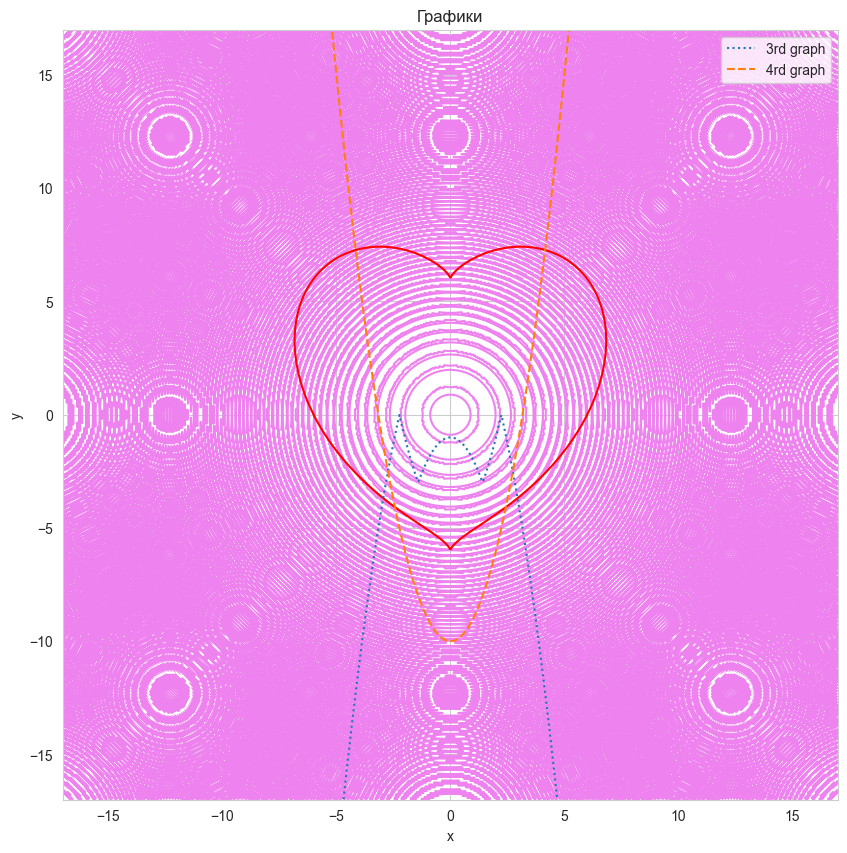

In [28]:
x = np.linspace(-17, 17, 800)
y = np.linspace(-17, 17, 800)
X, Y = np.meshgrid(x, y)
Z = np.tan(X ** 2 + Y ** 2) - 1
plt.figure(figsize=(10, 10))
contour1 = plt.contour(X, Y, Z, levels=[0], colors="violet", label="1st graph")

x2 = np.linspace(-17, 17, 800)
y2 = np.linspace(-17, 17, 800)
X2, Y2 = np.meshgrid(x2, y2)
Z2 = (X2 ** 2 + Y2 ** 2 - 36) ** 3 - ((X2 ** 2) * (Y2 ** 3) * 6)
contour2 = plt.contour(X2, Y2, Z2, levels=[0], colors="red", label="heart graph")

x3 = np.linspace(-17, 17, 800)
y3 = -np.abs(np.abs(x3 ** 2 - 2) - 3)
plt.ylim(-17, 17)
plt.plot(x3, y3, label="3rd graph", linestyle=":")

x4 = np.linspace(-17, 17, 800)
y4 = x4 ** 2 - 10
plt.ylim(-17, 17)
plt.plot(x4, y4, label="4rd graph", linestyle="--")

plt.title(f"Графики")
plt.xlabel("x")
plt.ylabel("y")
plt.legend()

plt.show()

### Задание 6 (0.5 балла)

Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируйте количество сэмплов в каждой из категорий отдельно для train и test сетов, как в примере ниже. Проследите, чтобы порядок категорий слева и справа был одинаков. Иначе не очень удобно их сравнивать (когда они в разных местах двух графиков). Также заметьте, что в примере ось Х в одинаковом масштабе, что тоже удобно для сравнения.

Вам может пригодиться:
- plt.barh или ax.barh

In [ ]:
count_of_records_train = train.groupby("Activity").size()
activities = count_of_records_train.index
counts = count_of_records_train.values
plt.barh(activities, counts, left=0)

count_of_records_test = test.groupby("Activity").size()
activities_test = count_of_records_test.index
counts_test = count_of_records_test.values
plt.barh(activities_test, -np.array(counts_test), left=0)

plt.title("Test                                             Train")
plt.show()

Правда на таких графиках проще проверять баланс классов таргета?) 
-Ага)

### Задание 7 (0.5 балла)

Ранее вы выводили таблицу корреляций. Однако просто таблица корреляций не очень удобна для анализа. Что, если признаков было бы больше? Визуализируйте heatmap корреляций. Подпишите значения корреляций, округленные до 2 знаков после запятой, на графике и оставьте только те значения, которые по модулю не меньше 0.5. Будем считать такие корреляции существенными. Если будете брать код из семинарского ноутбука, то поменяйте в нем что-нибудь, например, цветовую гамму, иначе проверяющий будет карать :)

Какой признак стоит исключить из рассмотрения корреляций? Напишите его название, а также причину, почему нет смысла его рассматривать.

Вам может пригодиться:
- sns.heatmap
- методы get_text и set_text у атрибута texts графика

In [ ]:
correlation_matrix = train[cols_subset].corr()
plt.figure(figsize=(12, 5))
sns.heatmap(correlation_matrix[abs(correlation_matrix) >= 0.5], annot=True, cmap='Blues')
plt.title('Correlation Matrix')
plt.show()

Из рассмотрения можно убрать признаки `subject` и `fBodyAcc-skewness()-X`, потому что они никак не коррелируют с другими признаками (корреляция очень слабая)

### Задание 8 (0.5 балла)

Для начала будем стрелять из пушки по воробьям. Выведите pairplot по всем данным train сета. Напишите, заметили ли вы в нем что-нибудь интересное, чего не было в таблицах и графиках ранее, а также сообщите, было ли вам удобно анализировать 100 графиков.

In [ ]:
list_to_pairplot = cols_subset.copy()
list_to_pairplot.remove("Activity_code")
sns.pairplot(train, x_vars=list_to_pairplot, y_vars=list_to_pairplot)

1. `fBodyAcc-skewness()-X` принимает почти все значения на всех графиках.
2. Зависимость `angle(Z,gravityMean)` и `angle(Y,gravityMean)` четко ограничивается произвольной фигурой (мешем). Также это относится к зависимостям между `angle(Z,gravityMean)` и `angle(X,gravityMean)`, `angle(Y,gravityMean)` и `angle(X,gravityMean)`.
3. В зависимости между `fBodyAcc-skewness()-X` и `tGravityAcc-mix()-X` есть чёткое разграничение между данными.
4. В зависимости между `tBodyAcc-max()-X` и `angle(Y,gravityMean)` есть уровень, ниже которого принимаются все значения, после этого их распределение сужается до определённого интервала

### Задание 9 (1 балл)

Окей. Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразите плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей, как в примере ниже. Видите закономерность? Можно ли поделить все активности на две группы? Если да, то проведите вертикальную линию, которая визуально неплохо разделяет эти группы.

Давайте первую группу называть статическими активностями, а вторую - динамическими.

Посчитайте, какую долю правильных ответов дает ваша вертикальная линия для разделения именно этих двух групп. С чем может быть связан полученный вами результат? Предположите логическое обоснование (почему именно данный признак так хорошо/плохо разделяет группы активностей).

Вам может пригодиться:
- sns.kdeplot

In [ ]:
# sns.kdeplot(data=train, x="tBodyAccMag-mean()", hue="Activity", fill=True)
sns.set_style("whitegrid")

for activity in activities:
    sns.kdeplot(
        data=train[train["Activity"] == activity],
        x="tBodyAccMag-mean()",
        label=activity,
        fill=True,
        alpha=0.05
    )
plt.legend(title="Activity", loc="upper right")

# Вот та самая разделяющая прямая
value_x = -0.49
plt.axvline(x=value_x, color="red", linestyle="--", linewidth=1)

Видим чёткое разделений. Ускорение у интенсивных (динамических) видов деятельности больше -0,4, у пассивных (статичных) оно меньше -0,7. Можно провести прямую (x = -0,49)

In [ ]:
intense_activities = ["WALKING", "WALKING_DOWNSTAIRS", "WALKING_UPSTAIRS"]
train["is_intense"] = train["Activity"].isin(intense_activities).astype(bool)
train["predicted_intensity"] = (train["tBodyAccMag-mean()"] >= value_x).astype(bool)
accuracy = (train["is_intense"] == train["predicted_intensity"]).sum() / len(train)
print(accuracy)

У нас достаточно хорошая accuracy (я подбирал ее, перебирая разные value_x в np.linspace(-0.6, -0.4, 20), почти во всех случаях правильно предсказывает правильную активность (в 99,25% случаев)
Логическое обоснование: ясно, что при достаточно большом ускорении человек скорее всего двигается, находится в динамике, если он статичен, оно будет состоять только из ускорения свободного падения (g) и находится в очень маленьком промежутке (не будет меняться). Поэтому мы можем чётко найти границу ускорений, ниже которой ускорения будут "похожи" на ускорения статичных активностей, а сверху - на ускорения динамических активностей. Мы проверили своё предположение и оно оказалось верное. 

### Задание 10 (0.5 балла)

Поздравляем, вы проверили первую гипотезу в процессе EDA. Однако нам бы хотелось уметь не группы разделять, а каждый отдельный вид активности. Попробуйте нарисовать "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train. Можно ли сделать какой-то вывод по полученной визуализации? Проанализируйте и проинтерпретируйте полученные картинки (если заметили какую-то особенность, может какая-то категория значительно выделяется, то предположите, почему так могло произойти).

Вам может пригодиться:
- sns.boxplot

In [ ]:
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=train,
    hue='Activity',
    y='angle(X,gravityMean)',
    gap=0.1,
)
plt.title("Angle between X-axis and gravitational acceleration")

По графику ящиков с усами видим сразу несколько чётких фактов.
1. Активность `LAYING` всегда имеет положительный угол с вектором гравитационного ускорения (направленного вниз) в пределах [0.2, 0.85]. Эти значения не пересекаются с остальными активностями, поэтому "лежание" мы практически всегда точно можем определить по свойству `angle(X,gravityMean)`. Это логично, потому что если угол в окрестности 0,5, значит тело человека выше пояса направлено горизонтально, а никакая другая активность не может иметь такое свойство (если человек идёт или стоит, то он идёт или стоит не в пол, багов в жизни, как в играх, у нас вроде нет :) ).
2. Все активности кроме `LAYING` имеют угол с вектором гравитационного ускорения в окрестности -0,75 (около pi/3). Это тоже логично, потому что люди идут и сидят немного под наклоном вперёд.
3. Угол в активности `WALKING_UPSTAIRS` немного меньше, чем у остальных (за исключением `LAYING`, естественно). Когда человек идёт по ступеням вверх, он еще больше наклоняется вперёд, чтобы не упасть.
4. Угол в активности `SITTING` имеет самый большой диапазон значений. Все люди сидят по-разному, кто-то больше наклоняется вперёд, кто-то меньше, кто-то ровно перпендикулярно полу. Этот диапазон захватывает все диапазоны других активностей (кроме `LAYING`), даже `WALKING_UPSTAIRS`, который и так выбивается из общей массы.

### Задание 11 (0.5 балла)

Посмотрим теперь на `tBodyAcc-max()-X`. Визуализируйте скрипичные диаграммы для этого признака с разделением по активностям на всем train. Кажется логичным, что максимальное ускорение в моменте для разных активностей будет различаться. Однако есть ли активность, которая будет выделяться? Если да, то предложите объяснение, почему эта активность выделяется.

Вам может пригодиться:
- sns.violinplot

Text(0.5, 1.0, 'Maximal body acceleration over activities')

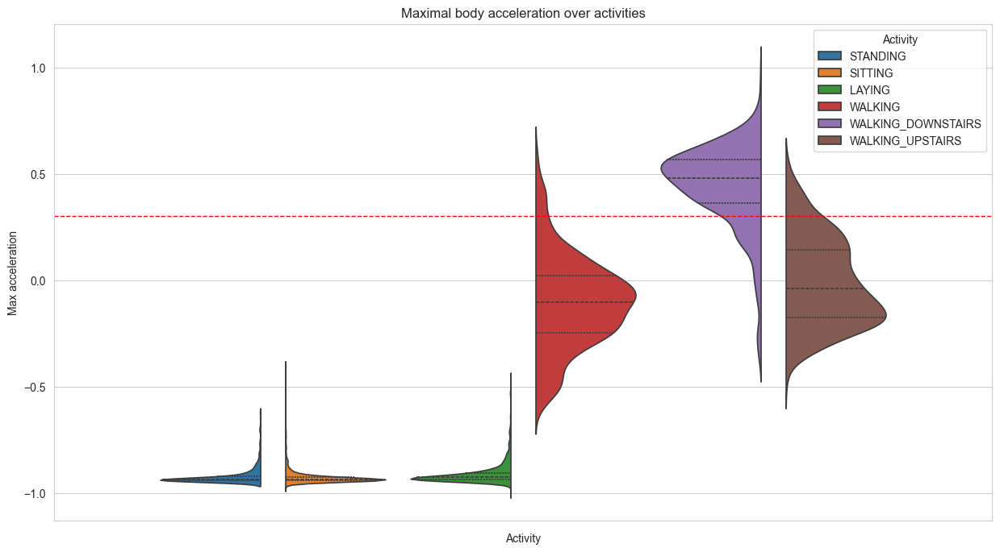

In [21]:
plt.figure(figsize=(15, 8))
sns.violinplot(
    data=train, 
    hue='Activity', 
    y='tBodyAcc-max()-X',
    split=True,
    gap=0.2,
    inner="quartile"
)

value_y = 0.3
plt.xlabel("Activity")
plt.ylabel("Max acceleration")
plt.axhline(y=value_y, color="red", linestyle="--", linewidth=1)
plt.title("Maximal body acceleration over activities")

Глядя на __violinplot__ выше мы можем примерно определить ещё одну активность - `WALKING_DOWNSTAIRS`. Она выделяется из общей массы своей уникальностью благодаря тому, что её значения находятся выше всех. Квантили не пересекаются с квантилями остальных распределений, однако сами распределения, естественно, пересекаются, поэтому мы не можем точно (с вероятностью, близкой к 100%) определить, какой из трех активностей (`WALKING`, `WALKING_DOWNSTAIRS` или `WALKING_UPSTAIRS`) принадлежит случайное значение `tBodyAcc-max()-X`. Хорошим примером подойдёт значение y=0.3. В таком случае можно сказать, наша активность может быть равновероятно как `WALKING_DOWNSTAIRS`, так и `WALKING_UPSTAIRS`, а с небольшой вероятностью даже `WALKING`. Но это значение редкое как во всех трёх группах (находится за квантилями), поэтому мы всё же можем предсказывать `WALKING_DOWNSTAIRS` по значению `tBodyAcc-max()-X`, хотя и с небольшой ошибкой.

### Задание 12 (1 балл)

Вы уже можете с довольно хорошим качеством выделить две категории активности из шести. Продолжим.

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажите распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (`boxenplot` - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже). Можно ли выделить еще какие-то активности? Если да, напишите, какие активности на 1 и 2 графиках выделяются.

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec (заметили, что один график больше другого? попробуйте сами так сделать - вам понравится...)
- sns.boxenplot
- sns.histplot

In [22]:
# train_static = train[(train['Activity'] == 'LAYING') | (train['Activity'] == 'SITTING') | (train['Activity'] == 'STANDING')]
# train_dynamic = train[~((train['Activity'] == 'LAYING') | (train['Activity'] == 'SITTING') | (train['Activity'] == 'STANDING'))]

static_activities = ['LAYING', 'SITTING', 'STANDING']
train_static = train[train['Activity'].isin(static_activities)]
train_dynamic = train[~train['Activity'].isin(static_activities)]

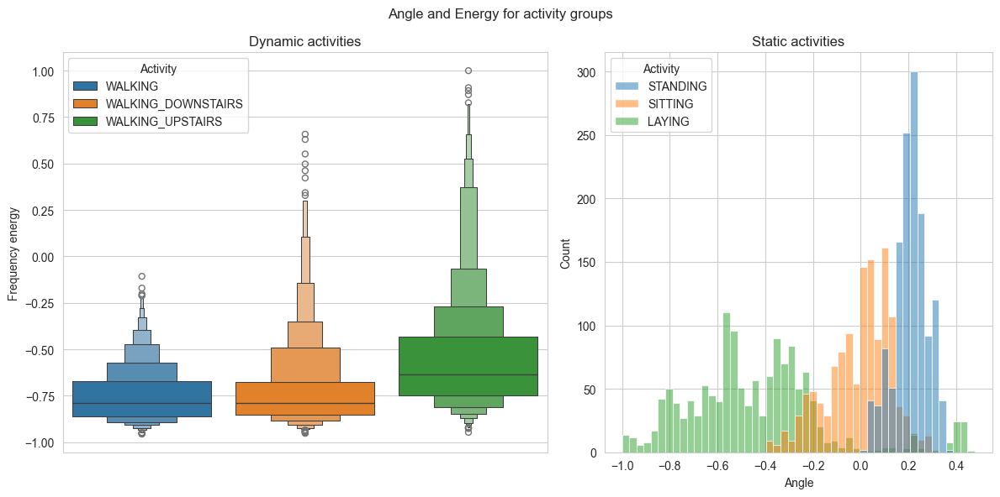

In [23]:
fig = plt.figure(figsize=(12, 6))
gs = plt.GridSpec(1, 2, width_ratios=[5, 4])
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sns.boxenplot(
    data=train_dynamic, 
    hue='Activity', 
    y='fBodyAcc-bandsEnergy()-1,8.2', 
    ax=ax1,
    gap=0.15,
    width=1.01
    # palette=["lightblue"]
)
sns.histplot(
    data=train_static, 
    hue='Activity', 
    x='angle(Y,gravityMean)',
    ax=ax2, 
    binwidth=0.03,
)


ax1.set_title('Dynamic activities')
ax1.set_ylabel('Frequency energy')
ax2.set_title('Static activities')
ax2.set_xlabel('Angle')
fig.suptitle("Angle and Energy for activity groups")

plt.tight_layout()
plt.show()

Наш признак fBodyAcc-bandsEnergy()-1,8.2 показывает, насколько сильно ускорение тела "дрожит" в диапазоне 1-8.2 Гц. Если энергия высокая, то в этом частотном диапазоне ускорение тела изменяется сильно. Если энергия низкая, то движения в этом диапазоне частот почти нет.
У `WALKING_UPSTAIRS` колебания больше, чем у других, однако распределение между квантилями все еще пересекается, поэтому предсказать возможно со значительной ошибкой.

Признак `angle(Y,gravityMean)` показывает угол относительно вектора гравитационного ускорения. На этом графике тоже можно разделить активности, потому что маленькие углы (< -0.2) соответствуют `LAYING`, между -0.2 и 0.1 - `SITTING`, > 0.1 - `STANDING`. Однако здесь тоже много пересечений, поэтому будет большая ошибка


### Задание 13 (0.5 балла)

Не всегда жизнь будет такой легкой, а данные будут полностью или почти линейно разделимы в одному признаку (иначе чем бы занимались дата саентисты...). Часто данные вообще ни по одному признаку нельзя адекватно разделить (да и по комбинациям признаков тоже). Давайте попробуем взять не один признак, а целых два!

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть. Разделимы ли категории по `fBodyAcc-skewness()-X`? А если взять только те строки, где `fBodyAcc-skewness()-X < -0.376`, и теперь вывести боксплот распределения `angle(Y,gravityMean)` по разным активностям? Попробуйте и напишите, выделилась ли какая-то категория?

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.boxplot

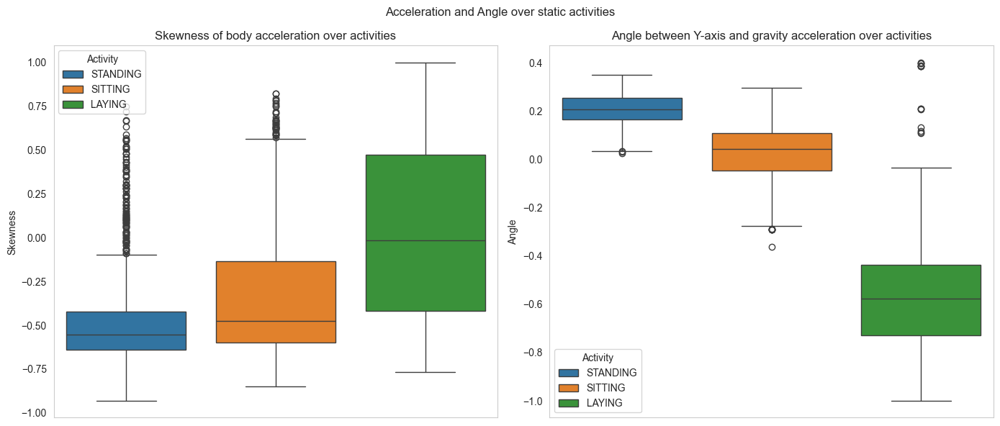

In [24]:
fig = plt.figure(figsize=(14, 6))
gs = plt.GridSpec(1, 2)
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sns.boxplot(
    data=train_static, 
    hue='Activity', 
    y='fBodyAcc-skewness()-X',
    ax=ax1,
    gap=0.2,
    width=1.01
)

sns.boxplot(
    data=train_static[train['fBodyAcc-skewness()-X'] < -0.376], 
    hue='Activity', 
    y='angle(Y,gravityMean)',
    ax=ax2,
    gap=0.2,
    width=1.01
)

ax1.grid(axis='y', linestyle='', alpha=0)
ax2.grid(axis='y', linestyle='', alpha=0)


ax1.set_title('Skewness of body acceleration over activities')
ax1.set_ylabel('Skewness')
ax2.set_title('Angle between Y-axis and gravity acceleration over activities')
ax2.set_ylabel('Angle')
fig.suptitle("Acceleration and Angle over static activities")

plt.tight_layout()
plt.show()

По первому графику тяжело найти исключительную активность, по крайней мере с хорошей точностью, т.к. даже `LAYING` и `SITTING` пересекаются квантилями.
Однако второй график упрощает ситуацию. Из-за того, что мы "очистили" выборку от кадров с низкочастотными колебаниями (`'fBodyAcc-skewness()-X'`), теперь границы между активностями стали чётче. Я бы не сказал, что по такому графику точность определения будет близка к 100, однако она будет уже достаточно хорошая, потому что данные не пересекаются квантилями, а `STANDING` и `SITTING` не пересекаются даже усиками (предположительные max и min выборки), только выбросами. 
<h5>Получается, что для кадров с высокочастотными колебаниями по оси oX (т.е. где fBodyAcc-skewness()-X < -0.376) мы с хорошей точностью можем определить статичную активность, а если научимся отличать SITTING от остальных статичных активностей, то с точностью, близкой к 100%</h5> 

Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 (1 балл)

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных. Да, можно было бы сказать, что, раз уж мы выделили 5 из 6 категорий, то все остальное - это и есть последняя категория, но мы не идем легкими путями. Выделить оставшуюсь категорию с хорошим качеством не так уж и просто. Из доступных признаков, сначала посмотрите на распределение `tBodyAcc-max()-X` на динамических активностях (скрипичная диаграмма отлично подойдет).

А теперь спускаем вам порог `tBodyAcc-max()-X < 0.157`. Для таких строк постройте диаграмму рассеяния для признака `tGravityAcc-min()-X`. Да, получается неидеально, но это честная работа. Можно выбрать порог так, чтобы чисто из таблицы с динамическими активностями из строк, где `tBodyAcc-max()-X < 0.157`, выбрать по некоторому порогу для `tGravityAcc-min()-X` строки так, чтобы доля правильных ответов на оставшейся категории была не меньше 83%!

Вам может пригодиться:
- plt.subplots или matplotlib.gridspec
- sns.violinplot
- sns.swarmplot (иногда лучше подходит, чем просто sns.scatterplot)

Обратите внимание, что подписи к осям можно убирать методами plt. Например, если у вас общее название для оси Y для обоих графиков, то можно не подписывать ось Y у второго графика.

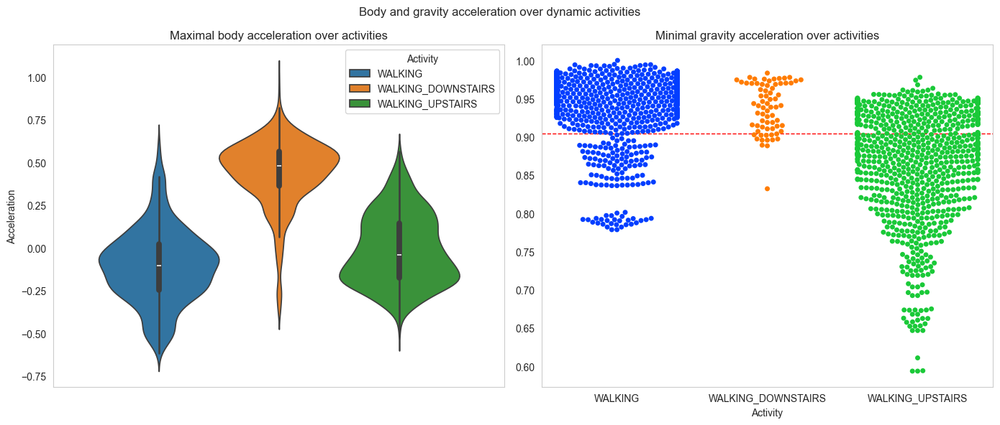

In [25]:
fig = plt.figure(figsize=(14, 6))
gs = plt.GridSpec(1, 2)
ax1 = plt.subplot(gs[0])
ax2 = plt.subplot(gs[1])

sns.violinplot(
    data=train_dynamic,
    hue='Activity',
    y='tBodyAcc-max()-X',
    ax=ax1
)

sns.swarmplot(
    data=train_dynamic[train['tBodyAcc-max()-X'] < 0.157],
    x='Activity', 
    y='tGravityAcc-min()-X',
    ax=ax2,
    palette="bright"
)
value_y = 0.904
ax2.axhline(y=value_y, color="red", linestyle="--", linewidth=1)

ax1.grid(axis='y', linestyle='', alpha=0)
ax2.grid(axis='y', linestyle='', alpha=0)

ax1.set_title('Maximal body acceleration over activities')
ax1.set_ylabel('Acceleration')
ax2.set_title('Minimal gravity acceleration over activities')
ax2.set_ylabel('')
fig.suptitle("Body and gravity acceleration over dynamic activities")

plt.tight_layout()
plt.show()

На левом графике видим, как распределены максимальные ускорения по окнам. По такому графику можно выделить только `WALKING_DOWNSTAIRS`, но его мы научились выделять ещё раньше. 
На правом графике мы, грубо говоря, обрезали данные, которые на левом графике выше y=0.157, и взяли уже их __минимальные__ значения ускорений в этих же окнах. Теперь видно, что такие данные можно разделить (хотя тоже не без ошибок) красной линией так, что выше __скорее всего__ активность будет `WALKING`, ниже - `WALKING_UPSTAIRS`. А `WALKING` и `WALKING_UPSTAIRS` мы научились различать ранее, так что группа динамических активностей тоже разобрана!

### Задание 15 (0.5 балла)

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`). Синтаксис очень похож на `seaborn`, но вот [документация для plotly.express](https://plotly.com/python-api-reference/plotly.express.html).

Сначала подготовим данные для визуализации. Будем считать t-SNE просто "черным ящиком", который принимает наши данные и проецирует их в двумерное или трехмерное пространство. Возможно, придется немного подождать.

In [7]:
%%time
from sklearn.manifold import TSNE

tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

CPU times: total: 46.5 s
Wall time: 2min 9s


Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [9]:
import plotly.express as px

px.scatter(
    data_frame=df_2_comp, 
    x='x', 
    y='y', 
    color="Activity"
)
# не знаю, что не так, честно((((( Все перепробовал, черный график

Мы не отстаем от трендов и тоже можем в 3D. Сейчас и вы научитесь (если еще не умеете). Нарисуйте scatter_3d-график через `plotly.express` для `df_3_comp` с выделением цветами активностей. Повращайте его. Нормально получилось? Есть ли какая-то структура у точек?

In [10]:
px.scatter_3d(
    data_frame=df_3_comp, 
    x='x', 
    y='y',
    z='z',
    color="Activity"
)

### Задание 16 (1 балл)

Мы сделали вам fit. Ваша очередь сделать predict. Допишите функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект. Рекомендуем сразу записывать из строками, а не кодировать в числа. Дальше фукнция `accuracy_score` выдаст вам долю правильных ответов.

Подсказка: вы уже отделили категории друг от друга по каким-то признакам. Воспользуйтесь этим знанием! Используя только проведенный вами анализ можно спокойно выбить не менее 75% на train и test! Если вы получите меньше 75%, то балл будет снижен. Авторское решение (на основе всех графиков выше) выбивает 81% и 77% на train и test соответственно. [Шпаргалка с готовыми идеями для такой задачи](https://rutube.ru/video/f884aa6ed5f94120b7304506042fe5bb/)

In [ ]:
def predict(df: pd.DataFrame):
    # ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ your code here
    pass


def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [ ]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.8109357997823722
Accuracy on test set => 0.7757041058703766


__Место для мема и/или фидбэка__

> тут